# Autoencoders

* Para reemplazar PCA en un contexto en el cual necesitamos un modelo end-to-end totalmente diferenciable podemos usar autoencoders para reducir la dimensionalidad.

* Los autoencoders son redes neuronales con una estructura particular que nos permiten aprender una representación de menor dimensionalidad de los datos de entrada. Este espacio latente es una representación densa de los datos de entrada que puede ser usada para reconstruir los datos originales.

* En este caso sabemos que PCA da buenos resultados para reducir la dimensionalidad de los datos, por lo que vamos a comparar primero PCA con autoencoders con activaciones no lineales y luego con autoencoders con activaciones lineales. La métrica que vamos a utilizar es comparar el error de reconstrucción entre las señales originales y las reconstruidas.

## PCA

* Utilizamos la implementación de PCA que habiamos hecho anteriormente.

In [1]:
# # within a Julia REPL
# import Pkg
# Pkg.add("Conda")
# using Conda
# Conda.pip_interop(true)
# Conda.pip("install", "webio_jupyter_extension")

In [2]:
using MultivariateStats
using DataFrames
using CSV
using Statistics
using Flux
using Plots
using Random
using IterTools: ncycle
using ProgressMeter
using LinearAlgebra
using Measures
include("../1-GeneracionDatos/Parameters.jl");

In [3]:
signalsDF = transpose(Matrix(CSV.read("C:/Users/Propietario/OneDrive/Escritorio/ib/Tesis_V1/MLonNMR/1-GeneracionDatos/Data/SimpleSignalHahn_TE_1_G_8.73e-7.csv", DataFrame)))

1099×5600 transpose(::Matrix{Float64}) with eltype Float64:
 1.0       1.0       1.0       …  1.0         1.0         1.0
 0.999997  0.999997  0.999997     0.999995    0.999995    0.999996
 0.999979  0.999979  0.999979     0.999964    0.999964    0.999964
 0.999945  0.999945  0.999945     0.999881    0.999881    0.999881
 0.999897  0.999897  0.999897     0.99972     0.99972     0.999721
 0.999837  0.999837  0.999837  …  0.999458    0.999458    0.999459
 0.99977   0.99977   0.99977      0.99907     0.999071    0.999072
 0.999697  0.999697  0.999697     0.998534    0.998536    0.998538
 0.99962   0.99962   0.999619     0.997828    0.997831    0.997834
 0.99954   0.99954   0.999539     0.996929    0.996933    0.996938
 0.999459  0.999458  0.999457  …  0.995816    0.995823    0.995829
 0.999376  0.999375  0.999374     0.994469    0.994478    0.994487
 0.999293  0.999292  0.99929      0.992868    0.99288     0.992892
 ⋮                             ⋱                          
 0.464639  0.46

In [4]:
column_lcm = collect(lcms)
column_sigma = collect(σs)

pdistparamsDF = zeros(size(signalsDF)[2], 2)

for (i, lcm) in enumerate(column_lcm)
    for (j, sigma) in enumerate(column_sigma)
        pdistparamsDF[(i - 1) * length(σs) + j, 1] = sigma
        pdistparamsDF[(i - 1) * length(σs) + j, 2] = lcm
    end
end

pdistparamsDF = DataFrame(pdistparamsDF, [:sigma, :lcm]);

In [5]:
# En cada columna tenmos los datos de las señales, centramos estas columnas para que tengan media 0
function centerData(matrix)
    """Función que centra los datos de las columnas de una matriz para que tengan media 0
    Parametros
        matrix: matriz con los datos a centrar
    Retorna
        centered_data: matriz con los datos centrados
    """
    col_means = mean(matrix, dims=1)
    centered_data = matrix .- col_means
    return centered_data, col_means
end

centerData (generic function with 1 method)

In [6]:
# Función que realiza PCA sobre los datos de entrada y grafica la varianza explicada por cada componente principal
function dataPCA(dataIN)
    """Función que realiza PCA sobre los datos de entrada y grafica la varianza explicada por cada componente principal

    Parametros
        dataIN: matriz con los datos a los que se les va a realizar PCA
    Retorna
        reduced_dataIN: datos reducidos por PCA
        pca_model: modelo de PCA que se puede usar para reconstruir los datos originales, además contiene información sobre los componentes principales
    """

    # Primero centramos los datos
    dataIN_C, _ = centerData(dataIN)

    # Esto ya hace PCA sobre la matriz dada donde cada observación es una columna de la matriz
    pca_model = fit(PCA, dataIN_C, maxoutdim=3)

    # Esta instancia de PCA tiene distintas funciones como las siguientes

    #projIN = projection(pca_model) # Proyección de los datos sobre los componentes principales

    # Vector con las contribuciones de cada componente (es decir los autovalores)
    pcsIN = principalvars(pca_model)

    # Obtenemos la variaza en porcentaje para cada componente principal
    explained_varianceIN = pcsIN / sum(pcsIN) * 100

    reducedIN = MultivariateStats.transform(pca_model, dataIN_C)

    return reducedIN, pca_model
end

dataPCA (generic function with 1 method)

* En PCA es mejor centrar los datos para que tengan media 0 antes de aplicarlo, esto es algo que también vamos a repetir en los autoencoders.

In [7]:
signalsDF_C , means_signals = centerData(signalsDF)

([0.06994902834283634 0.07007449380993347 … 0.906423213515355 0.9050613531289708; 0.0699456160979518 0.07007108178202459 … 0.9064187132263861 0.9050568546107142; … ; -0.500018944762548 -0.5001363075660062 … -0.08739748262571648 -0.08832808522978594; -0.5033343534684465 -0.5034454295082214 … -0.08743649950643774 -0.08836911307952244], [0.9300509716571637 0.9299255061900665 … 0.093576786484645 0.09493864687102918])

In [8]:
reduced_dataSignals, pca_model_signals = dataPCA(signalsDF)

([4.060287692254783 4.062057518788535 … -1.0089597563001358 -0.9943262471818994; 4.137253928933486 4.135772265167247 … 0.3150624106869956 0.3140602531410772; 1.1565214312935927 1.154691318562664 … -0.14953319330500525 -0.14900182825188463], PCA(indim = 1099, outdim = 3, principalratio = 0.9897557753243785))

In [10]:
plot(reduced_dataSignals[1, :], reduced_dataSignals[2, :], seriestype = :scatter, title = "PCA de las señales", xlabel = "Componente principal 1", ylabel = "Componente principal 2", legend = false, tickfontsize=11, labelfontsize=13, legendfontsize=8, framestyle =:box, gridlinewidth=1, xminorticks=10, yminorticks=10, right_margin=5mm)
savefig("C:/Users/Propietario/OneDrive/Escritorio/ib/Tesis_V1/MLonNMR/2-2-Autoencoders/Figuras/PCA_Signals.png")

"C:\\Users\\Propietario\\OneDrive\\Escritorio\\ib\\Tesis_V1\\MLonNMR\\2-2-Autoencoders\\Figuras\\PCA_Signals.png"

* Obtenemos el mismo resultado de siempre.

### Error de reconstrucción

* Usamos la inversa de la matriz de reducción para reconstruir los datos originales y ver si se pierde información en el proceso de reducción.

In [9]:
re_signals = reconstruct(pca_model_signals, reduced_dataSignals);

* El error de reconstrucción lo vamos a calcular con la raíz del error cuadrático medio (RMSE) $\sqrt{\frac{1}{N} \sum_{i=1}^{N} \frac{1}{M}\sum_{j = 1}^M ||S_i - \hat{S}_i||_j^2}$. Donde $S_i$ es la señal original y $\hat{S}_i$ es la señal reconstruida y $N$ es la cantidad de señales y $M$ el número de puntos en cada señal.

In [10]:
function RMSE_metric(x, y) # Función equivalente a hacer sqrt(Flux.mse(x, y))
    """Función que calcula el error cuadrático medio entre dos vectores
    Parametros
        X: matriz de señales
        Y: matriz de señales
    Retorna
        rmse: error cuadrático medio entre X e Y
    """

    M = size(x)[1] # Número de observaciones de las señales
    N = size(x)[2] # Número de señales
    
    rmse = sqrt(sum(abs2, x .- y) * 1/size(x)[1] * 1/size(x)[2])
    return rmse
end

RMSE_metric (generic function with 1 method)

In [11]:
println("Error MSE de reconstrucción de PCA: ", Flux.mse(signalsDF_C, re_signals))
println("Error RMSE de reconstrucción de PCA: ", RMSE_metric(signalsDF_C, re_signals))

Error MSE de reconstrucción de PCA: 4.7125315997926665e-5
Error RMSE de reconstrucción de PCA: 0.006864788124765882


## Autoencoders

* A diferencia de PCA, los autoencoders pueden aprender representaciones no lineales de los datos, sin embargo hay un gran paralelismo entre PCA y autoencoders cuando estos tienen una sola capa oculta con una capa de activación lineal. Como dijimos antes los autoencoders tienen una estructura particular que consiste en dos redes neuronales un encoder y un decoder. El encoder toma los datos de entrada como M dimensiones y los reduce a un espacio latente de menor dimensionalidad. El decoder toma el espacio latente y lo reconstruye a las M dimensiones originales. En este caso el espacio latente que vamos a querer aprender es de 3 dimensiones que es lo que nos da PCA por defecto sin perder casi nada de información.

![autoencoder](https://upload.wikimedia.org/wikipedia/commons/2/28/Autoencoder_structure.png)

* Vamos a explorar tres autoencoders distintos uno simple con una única capa oculta, otro con 4 capas ocultas y otro con 6 capas ocultas. En todos los casos vamos a comparar autoencoders con activaciones lineales y no lineales.

* Como vimos que PCA funciona bien con 3 dimensiones la dimension del espacio latente en los autoencoders va a ser de 3.

* Para evitar el overfitting vamos a utilizar regularización L2 en los pesos de las capas ocultas, además usamos early stopping que consiste en detener el entrenamiento cuando el error de validación deja de disminuir durante 100 épcas.

* El error de reconstrucción lo vamos a calcular de la misma forma que en PCA para poder comparar los resultados.

* También los datos van a ser comparados con la señal centrada 

# Autoencoder Simple

* Este autoencoder tiene una sola capa oculta con 3 neuronas para aprender la representación de menor dimensionalidad de las señales de entrada.

### Con activaciones lineales

In [12]:
rng = Random.seed!(1234)
perm = shuffle(rng, 1:size(signalsDF, 2));

In [13]:
# Random Shuflle
signalsDF = signalsDF[:, perm]
pdistparamsDF_unshuffled = pdistparamsDF
pdistparamsDF = pdistparamsDF[perm, :]
signalsDF_C_unshuffled = signalsDF_C
signalsDF_C = signalsDF_C[:, perm];

In [14]:
# Split en training, validation y test
n_signals = size(signalsDF_C, 2)
n_train = Int(floor(n_signals*0.7))
n_val = Int(floor(n_signals*0.15))
n_test = n_signals - n_train - n_val

train_signals = Float32.(Matrix(signalsDF_C[:, 1:n_train]))
val_signals = Float32.(Matrix(signalsDF_C[:, n_train+1:n_train+n_val]))
test_signals = Float32.(Matrix(signalsDF_C[:, n_train+n_val+1:end]))

train_params = pdistparamsDF[1:n_train, :]
val_params = pdistparamsDF[n_train+1:n_train+n_val, :]
test_params = pdistparamsDF[n_train+n_val+1:end, :];

In [15]:
n_times = size(train_signals, 1)

1099

In [18]:
# Autoencoder simple
encoderSimpleLineal = Chain(Dense(n_times, 3, identity, bias = false))
decoderSimpleLineal = Chain(Dense(3, n_times, identity, bias = false))
autoencoderSimpleLineal = Chain(encoderSimpleLineal, decoderSimpleLineal)

Chain(
  Chain(
    Dense(1099 => 3; bias=false),       # 3_297 parameters
  ),
  Chain(
    Dense(3 => 1099; bias=false),       # 3_297 parameters
  ),
) 

In [19]:
# s_params, s_re = Flux.destructure(autoencoderSimple)

In [20]:
# loader = Flux.Data.DataLoader((train_signals, train_signals), batchsize=50, shuffle=true)
# lr = 0.001
# optim = Flux.setup(Flux.AdamW(lr), autoencoderSimple)
# num_epochs = 500
# patience_epochs = 100

In [21]:
# function loss_re(x, y)
#     return Flux.mse(s_re(x), y)
# end

# function weight_orthogonality(W)
#     product = W * W'
#     sz = size(product)
#     return sqrt(sum(abs2, product - Matrix{Float32}(I, sz)))
# end

In [22]:
# lossesSimple = []
# lossesSimpleVal = []
# for epoch in 1:num_epochs
#     for (x, y) in loader
#         loss, grads = Flux.withgradient(autoencoderSimple) do m
#             Flux.mse(m(x), y)
#         end 
#         Flux.update!(optim, autoencoderSimple, grads[1])
#     end
#     actual_loss = Flux.mse(autoencoderSimple(train_signals), train_signals)
#     actual_loss_val = Flux.mse(autoencoderSimple(val_signals), val_signals)
    
#     if epoch > 1  && (actual_loss_val < minimum(lossesSimpleVal))

#         encoder_params, encoder_re = Flux.destructure(autoencoderSimple[1])
#         decoder_params, decoder_re = Flux.destructure(autoencoderSimple[2])

#         df_encoder = DataFrame(reshape(encoder_params, length(encoder_params), 1), :auto)
#         df_decoder = DataFrame(reshape(decoder_params, length(decoder_params), 1), :auto)

#         CSV.write("C:/Users/Propietario/OneDrive/Escritorio/ib/Tesis_V1/MLonNMR/2-2-Autoencoders/Models/minAE_PCAParamsE.csv", df_encoder)
#         CSV.write("C:/Users/Propietario/OneDrive/Escritorio/ib/Tesis_V1/MLonNMR/2-2-Autoencoders/Models/minAE_PCAParamsD.csv", df_decoder)
#     end

#     push!(lossesSimple, actual_loss)
#     push!(lossesSimpleVal, actual_loss_val)
#     println("Epoch: ", epoch, " Loss: ", actual_loss, " Loss Val: ", actual_loss_val)

#     if epoch % patience_epochs == 0
#         Flux.adjust!(optim, lr * 0.1)
#         loss_val_prev = lossesSimpleVal[end-patience_epochs+1]
#         if actual_loss_val > loss_val_prev
#             println("Early stopping at epoch: $epoch, because the validation loss is not decreasing after $patience_epochs epochs")
#             println("Loss de validación mínimo: ", minimum(lossesSimpleVal), " en la época: ", argmin(lossesSimpleVal))
#             break
#         end
#     end

#     GC.gc()
# end

In [23]:
loss_df = CSV.read("C:/Users/Propietario/OneDrive/Escritorio/ib/Tesis_V1/MLonNMR/2-2-Autoencoders/Models/Losses/simpleLLosses.csv", DataFrame)

loss_train = loss_df[:, 1]
loss_val = loss_df[:, 2]

plot(loss_train, label = "Training Loss", title = "Losses del autoencoder lineal simple", xlabel = "Época", ylabel = "Loss", legend = :best, tickfontsize=11, labelfontsize=13, legendfontsize=8, framestyle =:box, gridlinewidth=1, xminorticks=10, yminorticks=10, right_margin=5mm)
plot!(loss_val, label = "Validation Loss")

savefig("C:/Users/Propietario/OneDrive/Escritorio/ib/Tesis_V1/MLonNMR/2-2-Autoencoders/Figuras/LossesSimpleLineal.png")

"C:\\Users\\Propietario\\OneDrive\\Escritorio\\ib\\Tesis_V1\\MLonNMR\\2-2-Autoencoders\\Figuras\\LossesSimpleLineal.png"

Los loss de entrenamiento y validación son muy similares, no hay que preocuparse por overfitting.

In [24]:
println("Loss de validación mínimo: ", minimum(loss_val), " en la época: ", argmin(loss_val))

Loss de validación mínimo: 5.9781145e-5 en la época: 212


In [25]:
encoder_params, encoder_re = Flux.destructure(autoencoderSimpleLineal[1])
decoder_params, decoder_re = Flux.destructure(autoencoderSimpleLineal[2])

(Float32[0.027015785, 0.05172839, 0.054382555, 0.03125476, 0.030266736, -0.0094189495, 0.06372026, -0.027997345, 0.015250951, -0.051531225  …  0.06959321, 0.025177328, 0.0055428795, -0.07020845, -0.04136795, -0.057686925, 0.04499165, 0.019980798, -0.053744324, 0.061944593], Restructure(Chain, ..., 3297))

In [26]:
encoder_params = @views Float32.(CSV.read("C:/Users/Propietario/OneDrive/Escritorio/ib/Tesis_V1/MLonNMR/2-2-Autoencoders/Models/BestParams/minsimpleLParamsE.csv", DataFrame)[:,1])
decoder_params = @views Float32.(CSV.read("C:/Users/Propietario/OneDrive/Escritorio/ib/Tesis_V1/MLonNMR/2-2-Autoencoders/Models/BestParams/minsimpleLParamsD.csv", DataFrame)[:,1]);

autoencoderSimpleLineal = Chain(encoder_re(encoder_params), decoder_re(decoder_params))

Chain(
  Chain(
    Dense(1099 => 3; bias=false),       # 3_297 parameters
  ),
  Chain(
    Dense(3 => 1099; bias=false),       # 3_297 parameters
  ),
) 

In [27]:
println("Error de recosntrucción RMSE del autoencoder simple en el conjunto de test: ", RMSE_metric(test_signals, autoencoderSimpleLineal(test_signals)))

Error de recosntrucción RMSE del autoencoder simple en el conjunto de test: 0.008394564


Comparado con el error de reconstrucción de PCA (0.006864788124765882) este error del autoencoder simple con activacion lineal es mayor pero del orden.

In [28]:
reduced_signals_train = encoder_re(encoder_params)(train_signals)
reduced_signals_val = encoder_re(encoder_params)(val_signals)
reduced_signals_test = encoder_re(encoder_params)(test_signals)

3×841 Matrix{Float32}:
 -3.54706   -5.14903   -3.53737  -3.99311  …  -3.87914   -3.52779  -3.50381
  2.47108    7.95756    6.13233   5.46386      1.25328    6.6228    6.46814
 -0.548028  -0.861406  -4.57195  -3.12538      0.245748  -4.7017   -4.72787

* Grafiquemos el espacio reducido en 2D distinguiendo las señales por $l_{cm}$ como hicimos con PCA.

In [29]:
reduced_signals_train = encoder_re(encoder_params)(train_signals)
reduced_signals_val = encoder_re(encoder_params)(val_signals)
reduced_signals_test = encoder_re(encoder_params)(test_signals)

df_train = DataFrame(
    component1 = reduced_signals_train[1, :],
    component2 = reduced_signals_train[2, :],
    component3 = reduced_signals_train[3, :],
    sigma = train_params.sigma,
    lcm = train_params.lcm
)

df_val = DataFrame(
    component1 = reduced_signals_val[1, :],
    component2 = reduced_signals_val[2, :],
    component3 = reduced_signals_val[3, :],
    sigma = val_params.sigma,
    lcm = val_params.lcm
)

df_test = DataFrame(
    component1 = reduced_signals_test[1, :],
    component2 = reduced_signals_test[2, :],
    component3 = reduced_signals_test[3, :],
    sigma = test_params.sigma,
    lcm = test_params.lcm
)


scatter(df_train.component1, df_train.component2, group = df_train.lcm, 
        title = "Train Data coloreados por lcm", xlabel = "Component 1", ylabel = "Component 2", label = false, tickfontsize=11, labelfontsize=13, legendfontsize=8, framestyle =:box, gridlinewidth=1, xminorticks=10, yminorticks=10, right_margin=5mm)

savefig("C:/Users/Propietario/OneDrive/Escritorio/ib/Tesis_V1/MLonNMR/2-2-Autoencoders/Figuras/TrainDataSimpleLineal.png")

"C:\\Users\\Propietario\\OneDrive\\Escritorio\\ib\\Tesis_V1\\MLonNMR\\2-2-Autoencoders\\Figuras\\TrainDataSimpleLineal.png"

In [30]:
scatter(df_val.component1, df_val.component2, group = df_val.lcm, 
        title = "Validation Data coloreados por lcm", xlabel = "Component 1", ylabel = "Component 2", label = false, tickfontsize=11, labelfontsize=13, legendfontsize=8, framestyle =:box, gridlinewidth=1, xminorticks=10, yminorticks=10, right_margin=5mm)

savefig("C:/Users/Propietario/OneDrive/Escritorio/ib/Tesis_V1/MLonNMR/2-2-Autoencoders/Figuras/ValDataSimpleLineal.png")

"C:\\Users\\Propietario\\OneDrive\\Escritorio\\ib\\Tesis_V1\\MLonNMR\\2-2-Autoencoders\\Figuras\\ValDataSimpleLineal.png"

In [31]:
scatter(df_test.component1, df_test.component2, group = df_test.lcm, 
        title = "Test Data coloreados por lcm", xlabel = "Component 1", ylabel = "Component 2", label = false, tickfontsize=11, labelfontsize=13, legendfontsize=8, framestyle =:box, gridlinewidth=1, xminorticks=10, yminorticks=10, right_margin=5mm)

savefig("C:/Users/Propietario/OneDrive/Escritorio/ib/Tesis_V1/MLonNMR/2-2-Autoencoders/Figuras/TestDataSimpleLineal.png")

"C:\\Users\\Propietario\\OneDrive\\Escritorio\\ib\\Tesis_V1\\MLonNMR\\2-2-Autoencoders\\Figuras\\TestDataSimpleLineal.png"

* Las representaciones de las señales en el espacio latente son muy similares a las de PCA como era de esperarse ya que con activaciones lineales esto es casi equivalente a PCA. Si lo graficamos con plotly podemos tener una mejor visualización.

In [32]:
using PlotlyJS

WebIO._IJuliaInit()

In [33]:
reduced_all = encoder_re(encoder_params)(signalsDF_C_unshuffled)
df_reduced = DataFrame(
    component1 = reduced_all[1, :],
    component2 = reduced_all[2, :],
    component3 = reduced_all[3, :],
    sigma = pdistparamsDF_unshuffled.sigma,
    lcm = pdistparamsDF_unshuffled.lcm
);

┌ Warning: Layer with Float32 parameters got Float64 input.
│   The input will be converted, but any earlier layers may be very slow.
│   layer = Dense(1099 => 3; bias=false)  # 3_297 parameters
│   summary(x) = "1099×5600 Matrix{Float64}"
└ @ Flux C:\Users\Propietario\.julia\packages\Flux\FWgS0\src\layers\stateless.jl:50


In [34]:
PlotlyJS.plot(
    df_reduced,
    kind="scatter",
    mode="markers",
    x=:component1,
    y=:component2,
    color=:lcm,
    text= :sigma,
    hoverinfo= "text",
    Layout(
        title="Todos los datos coloreados por lcm",
        xaxis_title="Componente 1",
        yaxis_title="Componente 2",
        hoverlabel_bgcolor="white",
        hoverlabel_bordercolor="black",
        font_size=15
    )
)

data: [
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, m

In [35]:
# df_complete = Matrix(CSV.read("C:/Users/Propietario/OneDrive/Escritorio/ib/Tesis_V1/MLonNMR/1-GeneracionDatos/Data/SignalHahn_TE_1_G_8.73e-7_forPCA.csv", DataFrame));

In [36]:
# df_complete = df_complete[[idx != 1000 for idx in 1:size(df_complete, 1)], :];

In [37]:
# pdistparamsDF_complete = zeros(size(df_complete)[2], 2)

# lcms_comlete = 0.5:0.01:6
# σs_complete = 0.01:0.01:1

# for (i, lcm) in enumerate(lcms_comlete)
#     for (j, sigma) in enumerate(σs_complete)
#         pdistparamsDF_complete[(i - 1) * length(σs_complete) + j, 1] = sigma
#         pdistparamsDF_complete[(i - 1) * length(σs_complete) + j, 2] = lcm
#     end
# end

# pdistparamsDF_complete = DataFrame(pdistparamsDF_complete, [:sigma, :lcm]);

In [38]:
# df_complete_C , means_signals_complete = centerData(df_complete)

In [39]:
# df_reduced_complete = encoder_re(encoder_params)(df_complete_C)

# df_reduced_complete = DataFrame(
#     component1 = df_reduced_complete[1, :],
#     component2 = df_reduced_complete[2, :],
#     component3 = df_reduced_complete[3, :],
#     sigma = pdistparamsDF_complete.sigma,
#     lcm = pdistparamsDF_complete.lcm
# )

In [40]:
PlotlyJS.plot(
    df_reduced,
    kind="scatter",
    mode="markers",
    x=:component1,
    y=:component2,
    color=:lcm,
    text= :sigma,
    hoverinfo= "text",
    Layout(
        title="Todos los datos coloeados por lcm",
        xaxis_title="Componente 1",
        yaxis_title="Componente 2",
        hoverlabel_bgcolor="white",
        hoverlabel_bordercolor="black",
        font_size=15
    )
)

data: [
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, m

In [41]:
PlotlyJS.plot(
    df_reduced,
    kind="scatter",
    mode="markers",
    x=:component1,
    y=:component2,
    color=:sigma,
    text= :lcm,
    hoverinfo= "text",
    Layout(
        title="Todos los datos coloeados por σ",
        xaxis_title="Componente 1",
        yaxis_title="Componente 2",
        hoverlabel_bgcolor="white",
        hoverlabel_bordercolor="black",
        font_size=15
    )
)

data: [
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, m

### Autoencoder simple con activaciones no lineales

In [42]:
# Autoencoder simple
encoderSimpleNoLineal = Chain(Dense(n_times, 3, relu, bias = false))
decoderSimpleNoLineal = Chain(Dense(3, n_times, relu, bias = false))
autoencoderSimpleNoLineal = Chain(encoderSimpleNoLineal, decoderSimpleNoLineal)

Chain(
  Chain(
    Dense(1099 => 3, relu; bias=false),  # 3_297 parameters
  ),
  Chain(
    Dense(3 => 1099, relu; bias=false),  # 3_297 parameters
  ),
) 

In [43]:
loss_df = CSV.read("C:/Users/Propietario/OneDrive/Escritorio/ib/Tesis_V1/MLonNMR/2-2-Autoencoders/Models/Losses/simpleNLLosses.csv", DataFrame)

loss_train = loss_df[:, 1]
loss_val = loss_df[:, 2]

plot(loss_train, label = "Training Loss", title = "Losses del autoencoder no lineal simple", xlabel = "Época", ylabel = "Loss", legend = :best)
plot!(loss_val, label = "Validation Loss")
savefig("C:/Users/Propietario/OneDrive/Escritorio/ib/Tesis_V1/MLonNMR/2-2-Autoencoders/Figuras/LossesSimpleNoLineal.png")

"C:\\Users\\Propietario\\OneDrive\\Escritorio\\ib\\Tesis_V1\\MLonNMR\\2-2-Autoencoders\\Figuras\\LossesSimpleNoLineal.png"

In [44]:
encoder_params = @views Float32.(CSV.read("C:/Users/Propietario/OneDrive/Escritorio/ib/Tesis_V1/MLonNMR/2-2-Autoencoders/Models/BestParams/minsimpleNLParamsE.csv", DataFrame)[:,1])
decoder_params = @views Float32.(CSV.read("C:/Users/Propietario/OneDrive/Escritorio/ib/Tesis_V1/MLonNMR/2-2-Autoencoders/Models/BestParams/minsimpleNLParamsD.csv", DataFrame)[:,1]);

autoencoderSimpleNoLineal = Chain(encoder_re(encoder_params), decoder_re(decoder_params))

Chain(
  Chain(
    Dense(1099 => 3; bias=false),       # 3_297 parameters
  ),
  Chain(
    Dense(3 => 1099; bias=false),       # 3_297 parameters
  ),
) 

In [45]:
println("Error de recosntrucción RMSE del autoencoder simple en el conjunto de test: ", RMSE_metric(test_signals, autoencoderSimpleNoLineal(test_signals)))

Error de recosntrucción RMSE del autoencoder simple en el conjunto de test: 0.008394564


Comparado con el error de reconstrucción de PCA (0.006864788124765882) este error del autoencoder simple con activacion no lineal es mayor.

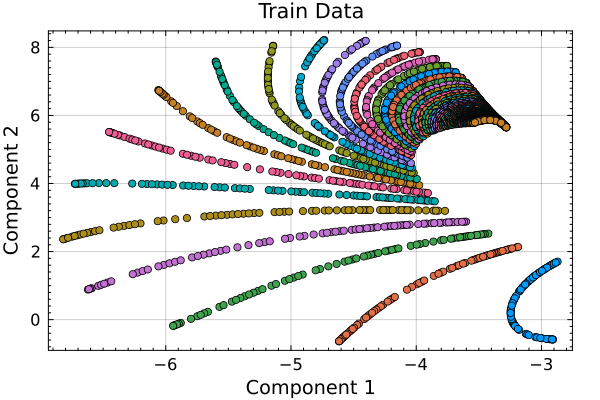

In [46]:
reduced_signals_train = encoder_re(encoder_params)(train_signals)
reduced_signals_val = encoder_re(encoder_params)(val_signals)
reduced_signals_test = encoder_re(encoder_params)(test_signals)

df_train = DataFrame(
    component1 = reduced_signals_train[1, :],
    component2 = reduced_signals_train[2, :],
    component3 = reduced_signals_train[3, :],
    sigma = train_params.sigma,
    lcm = train_params.lcm
)

df_val = DataFrame(
    component1 = reduced_signals_val[1, :],
    component2 = reduced_signals_val[2, :],
    component3 = reduced_signals_val[3, :],
    sigma = val_params.sigma,
    lcm = val_params.lcm
)

df_test = DataFrame(
    component1 = reduced_signals_test[1, :],
    component2 = reduced_signals_test[2, :],
    component3 = reduced_signals_test[3, :],
    sigma = test_params.sigma,
    lcm = test_params.lcm
)


# Plotting with grouping by 'lcm' and coloring by 'sigma'
scatter(df_train.component1, df_train.component2, group = df_train.lcm, 
        title = "Train Data", xlabel = "Component 1", ylabel = "Component 2", label = false , tickfontsize=11, labelfontsize=13, legendfontsize=8, framestyle =:box, gridlinewidth=1, xminorticks=10, yminorticks=10, right_margin=5mm)

* Similar al caso anterior, esto quizás se deba a que la estructura del autoencoder es muy similar a PCA.

# Autoencoder con 4 capas ocultas

## Caso con activaciones lineales
* En este caso vamos a ver la representación de las señales en el espacio latente con el autoencoder con 4 capas ocultas y activaciones lineales.
* Vamos a comparar el error de reconstrucción con PCA.

In [47]:
encoderDeepLineal = Chain(Dense(n_times, 100, identity, bias = false), Dense(100, 50, identity), Dense(50, 3, identity))
decoderDeepLineal = Chain(Dense(3, 50, identity, bias = false), Dense(50, 100, identity), Dense(100, n_times, identity))
autoencoderDeepLineal = Chain(encoderDeepLineal, decoderDeepLineal)

Chain(
  Chain(
    Dense(1099 => 100; bias=false),     # 109_900 parameters
    Dense(100 => 50),                   # 5_050 parameters
    Dense(50 => 3),                     # 153 parameters
  ),
  Chain(
    Dense(3 => 50; bias=false),         # 150 parameters
    Dense(50 => 100),                   # 5_100 parameters
    Dense(100 => 1099),                 # 110_999 parameters
  ),
)                   # Total: 10 arrays, 231_352 parameters, 904.578 KiB.

In [48]:
loss_df = CSV.read("C:/Users/Propietario/OneDrive/Escritorio/ib/Tesis_V1/MLonNMR/2-2-Autoencoders/Models/Losses/deepLLosses.csv", DataFrame)

loss_train = loss_df[:, 1]
loss_val = loss_df[:, 2]

plot(loss_train, label = "Training Loss", title = "Losses del autoencoder profundo lineal", xlabel = "Época", ylabel = "Loss", legend = :best, tickfontsize=11, labelfontsize=13, legendfontsize=8, framestyle =:box, gridlinewidth=1, xminorticks=10, yminorticks=10, right_margin=5mm)
plot!(loss_val, label = "Validation Loss")
savefig("C:/Users/Propietario/OneDrive/Escritorio/ib/Tesis_V1/MLonNMR/2-2-Autoencoders/Figuras/LossesDeepLineal.png")

"C:\\Users\\Propietario\\OneDrive\\Escritorio\\ib\\Tesis_V1\\MLonNMR\\2-2-Autoencoders\\Figuras\\LossesDeepLineal.png"

In [49]:
encoder_params, encoder_re = Flux.destructure(autoencoderDeepLineal[1])
decoder_params, decoder_re = Flux.destructure(autoencoderDeepLineal[2])

(Float32[0.008730405, 0.22851306, -0.17718033, 0.3134193, 0.09409103, 0.3244766, 0.01200166, -0.22338738, 0.27421388, -0.27382192  …  0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], Restructure(Chain, ..., 116249))

In [50]:
encoder_params = @views Float32.(CSV.read("C:/Users/Propietario/OneDrive/Escritorio/ib/Tesis_V1/MLonNMR/2-2-Autoencoders/Models/BestParams/mindeepLParamsE.csv", DataFrame)[:,1])
decoder_params = @views Float32.(CSV.read("C:/Users/Propietario/OneDrive/Escritorio/ib/Tesis_V1/MLonNMR/2-2-Autoencoders/Models/BestParams/mindeepLParamsD.csv", DataFrame)[:,1]);

autoencoderDeepLineal = Chain(encoder_re(encoder_params), decoder_re(decoder_params))

Chain(
  Chain(
    Dense(1099 => 100; bias=false),     # 109_900 parameters
    Dense(100 => 50),                   # 5_050 parameters
    Dense(50 => 3),                     # 153 parameters
  ),
  Chain(
    Dense(3 => 50; bias=false),         # 150 parameters
    Dense(50 => 100),                   # 5_100 parameters
    Dense(100 => 1099),                 # 110_999 parameters
  ),
)                   # Total: 10 arrays, 231_352 parameters, 904.578 KiB.

In [51]:
println("Error de recosntrucción RMSE del autoencoder simple en el conjunto de test: ", RMSE_metric(test_signals, autoencoderDeepLineal(test_signals)))

Error de recosntrucción RMSE del autoencoder simple en el conjunto de test: 0.006836749


Comparado con el error de reconstrucción de PCA (0.006864788124765882) este error del autoencoder con 4 capas ocultas y activacion lineal es casi igual.

In [52]:
reduced_all = encoder_re(encoder_params)(signalsDF_C_unshuffled)

df_reduced = DataFrame(
    component1 = reduced_all[1, :],
    component2 = reduced_all[2, :],
    component3 = reduced_all[3, :],
    sigma = pdistparamsDF_unshuffled.sigma,
    lcm = pdistparamsDF_unshuffled.lcm
)

scatter(df_reduced.component1, df_reduced.component2, group = df_reduced.lcm, 
        title = "Todos los datos coloreados por lcm", xlabel = "Component 1", ylabel = "Component 2", label = false, tickfontsize=11, labelfontsize=13, legendfontsize=8, framestyle =:box, gridlinewidth=1, xminorticks=10, yminorticks=10, right_margin=5mm)

savefig("C:/Users/Propietario/OneDrive/Escritorio/ib/Tesis_V1/MLonNMR/2-2-Autoencoders/Figuras/AllDataDeepLineal.png")

"C:\\Users\\Propietario\\OneDrive\\Escritorio\\ib\\Tesis_V1\\MLonNMR\\2-2-Autoencoders\\Figuras\\AllDataDeepLineal.png"

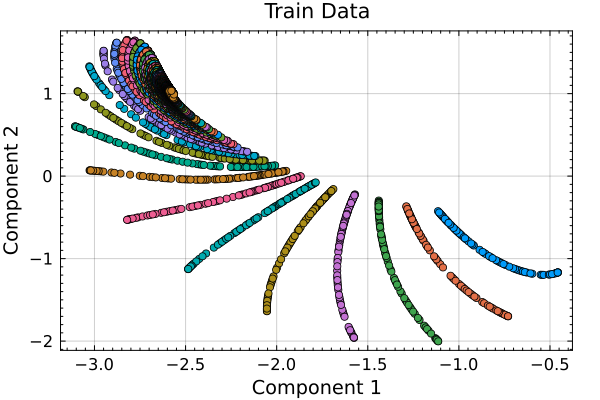

In [53]:
reduced_signals_train = encoder_re(encoder_params)(train_signals)
reduced_signals_val = encoder_re(encoder_params)(val_signals)
reduced_signals_test = encoder_re(encoder_params)(test_signals)

df_train = DataFrame(
    component1 = reduced_signals_train[1, :],
    component2 = reduced_signals_train[2, :],
    component3 = reduced_signals_train[3, :],
    sigma = train_params.sigma,
    lcm = train_params.lcm
)

df_val = DataFrame(
    component1 = reduced_signals_val[1, :],
    component2 = reduced_signals_val[2, :],
    component3 = reduced_signals_val[3, :],
    sigma = val_params.sigma,
    lcm = val_params.lcm
)

df_test = DataFrame(
    component1 = reduced_signals_test[1, :],
    component2 = reduced_signals_test[2, :],
    component3 = reduced_signals_test[3, :],
    sigma = test_params.sigma,
    lcm = test_params.lcm
)


scatter(df_train.component1, df_train.component2, group = df_train.lcm, 
        title = "Train Data", xlabel = "Component 1", ylabel = "Component 2", label = false, tickfontsize=11, labelfontsize=13, legendfontsize=8, framestyle =:box, gridlinewidth=1, xminorticks=10, yminorticks=10, right_margin=5mm)

## Caso con activaciones no lineales

In [54]:
encoderDeepNoLineal = Chain(Dense(n_times, 100, bias = false), Dense(100, 50, relu), Dense(50, 3))
decoderDeepNoLineal = Chain(Dense(3, 50, bias = false), Dense(50, 100, relu), Dense(100, n_times))
autoencoderDeepNoLineal = Chain(encoderDeepNoLineal, decoderDeepNoLineal)

Chain(
  Chain(
    Dense(1099 => 100; bias=false),     # 109_900 parameters
    Dense(100 => 50, relu),             # 5_050 parameters
    Dense(50 => 3),                     # 153 parameters
  ),
  Chain(
    Dense(3 => 50; bias=false),         # 150 parameters
    Dense(50 => 100, relu),             # 5_100 parameters
    Dense(100 => 1099),                 # 110_999 parameters
  ),
)                   # Total: 10 arrays, 231_352 parameters, 904.578 KiB.

In [55]:
loss_df = CSV.read("C:/Users/Propietario/OneDrive/Escritorio/ib/Tesis_V1/MLonNMR/2-2-Autoencoders/Models/Losses/deepNLLosses.csv", DataFrame)

loss_train = loss_df[:, 1]
loss_val = loss_df[:, 2]

epochs = 1:length(loss_train)

plot(epochs[20:end], loss_train[20:end], label = "Training Loss", title = "Losses del autoencoder profundo no lineal", xlabel = "Época", ylabel = "Loss", legend = :best, tickfontsize=11, labelfontsize=13, legendfontsize=8, framestyle =:box, gridlinewidth=1, xminorticks=10, yminorticks=10, right_margin=5mm)
plot!(epochs[20:end], loss_val[20:end], label = "Validation Loss")

savefig("C:/Users/Propietario/OneDrive/Escritorio/ib/Tesis_V1/MLonNMR/2-2-Autoencoders/Figuras/LossesDeepNoLineal.png")

"C:\\Users\\Propietario\\OneDrive\\Escritorio\\ib\\Tesis_V1\\MLonNMR\\2-2-Autoencoders\\Figuras\\LossesDeepNoLineal.png"

In [56]:
encoder_params, encoder_re = Flux.destructure(autoencoderDeepNoLineal[1])
decoder_params, decoder_re = Flux.destructure(autoencoderDeepNoLineal[2])

(Float32[-0.21252981, -0.24847153, -0.23920025, 0.15966855, 0.06454782, 0.040564634, 0.19283457, 0.15075664, -0.01780487, -0.07396029  …  0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], Restructure(Chain, ..., 116249))

In [57]:
encoder_params = @views Float32.(CSV.read("C:/Users/Propietario/OneDrive/Escritorio/ib/Tesis_V1/MLonNMR/2-2-Autoencoders/Models/BestParams/mindeepNLParamsE.csv", DataFrame)[:,1])
decoder_params = @views Float32.(CSV.read("C:/Users/Propietario/OneDrive/Escritorio/ib/Tesis_V1/MLonNMR/2-2-Autoencoders/Models/BestParams/mindeepNLParamsD.csv", DataFrame)[:,1]);

autoencoderDeepNoLineal = Chain(encoder_re(encoder_params), decoder_re(decoder_params))

Chain(
  Chain(
    Dense(1099 => 100; bias=false),     # 109_900 parameters
    Dense(100 => 50, relu),             # 5_050 parameters
    Dense(50 => 3),                     # 153 parameters
  ),
  Chain(
    Dense(3 => 50; bias=false),         # 150 parameters
    Dense(50 => 100, relu),             # 5_100 parameters
    Dense(100 => 1099),                 # 110_999 parameters
  ),
)                   # Total: 10 arrays, 231_352 parameters, 904.578 KiB.

In [58]:
println("Error de recosntrucción RMSE del autoencoder no lineal profundo en el conjunto de test: ", RMSE_metric(test_signals, autoencoderDeepNoLineal(test_signals)))

Error de recosntrucción RMSE del autoencoder no lineal profundo en el conjunto de test: 0.0016314732


Comparado con el error de reconstrucción de PCA (0.006864788124765882) este error del autoencoder con 4 capas ocultas y activacion no lineal es menor.

In [59]:
reduced_all = encoder_re(encoder_params)(signalsDF_C_unshuffled)

df_reduced = DataFrame(
    component1 = reduced_all[1, :],
    component2 = reduced_all[2, :],
    component3 = reduced_all[3, :],
    sigma = pdistparamsDF_unshuffled.sigma,
    lcm = pdistparamsDF_unshuffled.lcm
)

scatter(df_reduced.component1, df_reduced.component2, group = df_reduced.lcm, 
        title = "Todos los datos coloreados por lcm", xlabel = "Component 1", ylabel = "Component 2", label = false, tickfontsize=11, labelfontsize=13, legendfontsize=8, framestyle =:box, gridlinewidth=1, xminorticks=10, yminorticks=10, right_margin=5mm)

savefig("C:/Users/Propietario/OneDrive/Escritorio/ib/Tesis_V1/MLonNMR/2-2-Autoencoders/Figuras/AllDataDeepNoLineal.png")

"C:\\Users\\Propietario\\OneDrive\\Escritorio\\ib\\Tesis_V1\\MLonNMR\\2-2-Autoencoders\\Figuras\\AllDataDeepNoLineal.png"

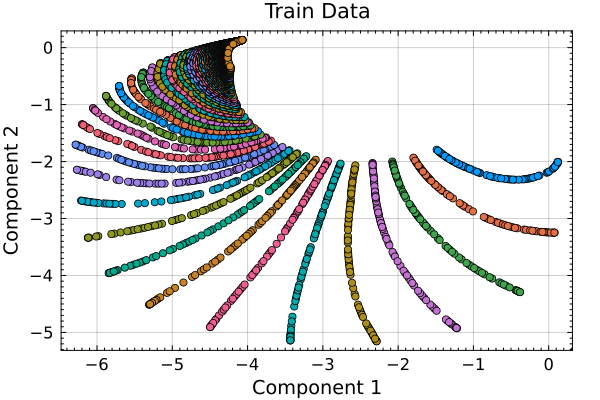

In [60]:
reduced_signals_train = encoder_re(encoder_params)(train_signals)
reduced_signals_val = encoder_re(encoder_params)(val_signals)
reduced_signals_test = encoder_re(encoder_params)(test_signals)

df_train = DataFrame(
    component1 = reduced_signals_train[1, :],
    component2 = reduced_signals_train[2, :],
    component3 = reduced_signals_train[3, :],
    sigma = train_params.sigma,
    lcm = train_params.lcm
)

df_val = DataFrame(
    component1 = reduced_signals_val[1, :],
    component2 = reduced_signals_val[2, :],
    component3 = reduced_signals_val[3, :],
    sigma = val_params.sigma,
    lcm = val_params.lcm
)

df_test = DataFrame(
    component1 = reduced_signals_test[1, :],
    component2 = reduced_signals_test[2, :],
    component3 = reduced_signals_test[3, :],
    sigma = test_params.sigma,
    lcm = test_params.lcm
)


# Plotting with grouping by 'lcm' and coloring by 'sigma'
scatter(df_train.component1, df_train.component2, group = df_train.lcm, 
        title = "Train Data", xlabel = "Component 1", ylabel = "Component 2", label = false, tickfontsize=11, labelfontsize=13, legendfontsize=8, framestyle =:box, gridlinewidth=1, xminorticks=10, yminorticks=10, right_margin=5mm)

# Autoencoder con 6 capas ocultas

* En este caso vamos a ver la representación de las señales en el espacio latente con el autoencoder con 6 capas ocultas y activaciones lineales.
* Vamos a comparar el error de reconstrucción con PCA.

In [61]:
encoderDeeperLineal = Chain(Dense(n_times, 500, bias = false), Dense(500, 100), Dense(100, 50), Dense(50, 3))
decoderDeeperLineal = Chain(Dense(3, 50, bias = false), Dense(50, 100), Dense(100, 500), Dense(500, n_times))
autoencoderDeeperLineal = Chain(encoderDeeperLineal, decoderDeeperLineal)

Chain(
  Chain(
    Dense(1099 => 500; bias=false),     # 549_500 parameters
    Dense(500 => 100),                  # 50_100 parameters
    Dense(100 => 50),                   # 5_050 parameters
    Dense(50 => 3),                     # 153 parameters
  ),
  Chain(
    Dense(3 => 50; bias=false),         # 150 parameters
    Dense(50 => 100),                   # 5_100 parameters
    Dense(100 => 500),                  # 50_500 parameters
    Dense(500 => 1099),                 # 550_599 parameters
  ),
)                   # Total: 14 arrays, 1_211_152 parameters, 4.621 MiB.

In [62]:
loss_df = CSV.read("C:/Users/Propietario/OneDrive/Escritorio/ib/Tesis_V1/MLonNMR/2-2-Autoencoders/Models/Losses/deeperLLosses.csv", DataFrame)

loss_train = loss_df[:, 1]
loss_val = loss_df[:, 2]

epochs = 1:length(loss_train)

plot(epochs[1:end], loss_train[1:end], label = "Training Loss", title = "Losses del autoencoder más profundo lineal", xlabel = "Época", ylabel = "Loss", legend = :best, tickfontsize=11, labelfontsize=13, legendfontsize=8, framestyle =:box, gridlinewidth=1, xminorticks=10, yminorticks=10, right_margin=5mm)
plot!(epochs[1:end], loss_val[1:end], label = "Validation Loss")

savefig("C:/Users/Propietario/OneDrive/Escritorio/ib/Tesis_V1/MLonNMR/2-2-Autoencoders/Figuras/LossesDeeperLineal.png")

"C:\\Users\\Propietario\\OneDrive\\Escritorio\\ib\\Tesis_V1\\MLonNMR\\2-2-Autoencoders\\Figuras\\LossesDeeperLineal.png"

In [63]:
encoder_params, encoder_re = Flux.destructure(autoencoderDeeperLineal[1])
decoder_params, decoder_re = Flux.destructure(autoencoderDeeperLineal[2])

encoder_params = @views Float32.(CSV.read("C:/Users/Propietario/OneDrive/Escritorio/ib/Tesis_V1/MLonNMR/2-2-Autoencoders/Models/BestParams/mindeeperLParamsE.csv", DataFrame)[:,1])
decoder_params = @views Float32.(CSV.read("C:/Users/Propietario/OneDrive/Escritorio/ib/Tesis_V1/MLonNMR/2-2-Autoencoders/Models/BestParams/mindeeperLParamsD.csv", DataFrame)[:,1]);

autoencoderDeeperLineal = Chain(encoder_re(encoder_params), decoder_re(decoder_params))

Chain(
  Chain(
    Dense(1099 => 500; bias=false),     # 549_500 parameters
    Dense(500 => 100),                  # 50_100 parameters
    Dense(100 => 50),                   # 5_050 parameters
    Dense(50 => 3),                     # 153 parameters
  ),
  Chain(
    Dense(3 => 50; bias=false),         # 150 parameters
    Dense(50 => 100),                   # 5_100 parameters
    Dense(100 => 500),                  # 50_500 parameters
    Dense(500 => 1099),                 # 550_599 parameters
  ),
)                   # Total: 14 arrays, 1_211_152 parameters, 4.621 MiB.

In [64]:
println("Error de recosntrucción RMSE del autoencoder simple en el conjunto de test: ", RMSE_metric(test_signals, autoencoderDeeperLineal(test_signals)))

Error de recosntrucción RMSE del autoencoder simple en el conjunto de test: 0.006838203


Comparado con el error de reconstrucción de PCA (0.006864788124765882) este error del autoencoder con 6 capas ocultas y activacion lineal es similar.

In [65]:
reduced_all = encoder_re(encoder_params)(signalsDF_C_unshuffled)

df_reduced = DataFrame(
    component1 = reduced_all[1, :],
    component2 = reduced_all[2, :],
    component3 = reduced_all[3, :],
    sigma = pdistparamsDF_unshuffled.sigma,
    lcm = pdistparamsDF_unshuffled.lcm
)

scatter(df_reduced.component1, df_reduced.component2, group = df_reduced.lcm, 
        title = "Todos los datos coloreados por lcm", xlabel = "Component 1", ylabel = "Component 2", label = false, tickfontsize=11, labelfontsize=13, legendfontsize=8, framestyle =:box, gridlinewidth=1, xminorticks=10, yminorticks=10, right_margin=5mm)

savefig("C:/Users/Propietario/OneDrive/Escritorio/ib/Tesis_V1/MLonNMR/2-2-Autoencoders/Figuras/AllDataDeeperLineal.png")

"C:\\Users\\Propietario\\OneDrive\\Escritorio\\ib\\Tesis_V1\\MLonNMR\\2-2-Autoencoders\\Figuras\\AllDataDeeperLineal.png"

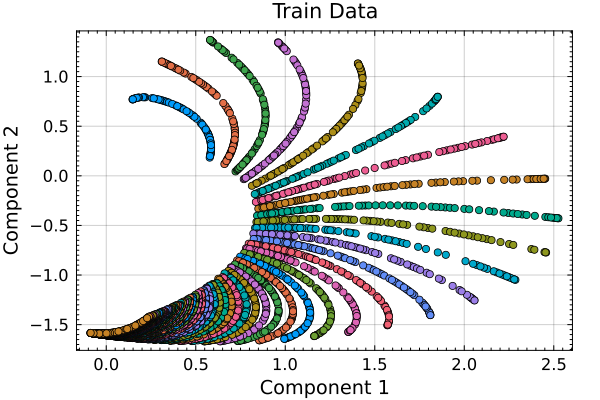

In [66]:
reduced_signals_train = encoder_re(encoder_params)(train_signals)
reduced_signals_val = encoder_re(encoder_params)(val_signals)
reduced_signals_test = encoder_re(encoder_params)(test_signals)

df_train = DataFrame(
    component1 = reduced_signals_train[1, :],
    component2 = reduced_signals_train[2, :],
    component3 = reduced_signals_train[3, :],
    sigma = train_params.sigma,
    lcm = train_params.lcm
)

df_val = DataFrame(
    component1 = reduced_signals_val[1, :],
    component2 = reduced_signals_val[2, :],
    component3 = reduced_signals_val[3, :],
    sigma = val_params.sigma,
    lcm = val_params.lcm
)

df_test = DataFrame(
    component1 = reduced_signals_test[1, :],
    component2 = reduced_signals_test[2, :],
    component3 = reduced_signals_test[3, :],
    sigma = test_params.sigma,
    lcm = test_params.lcm
)


# Plotting with grouping by 'lcm' and coloring by 'sigma'
scatter(df_train.component1, df_train.component2, group = df_train.lcm, 
        title = "Train Data", xlabel = "Component 1", ylabel = "Component 2", label = false, tickfontsize=11, labelfontsize=13, legendfontsize=8, framestyle =:box, gridlinewidth=1, xminorticks=10, yminorticks=10, right_margin=5mm)

* En este caso la representación es similar a la de PCA pero rotada y mas comprimida.

## Caso con activaciones no lineales

In [16]:
n_times = size(signalsDF, 1)

1099

In [17]:
encoderDeeperNoLineal = Chain(Dense(n_times, 500, bias = false), Dense(500, 100, relu), Dense(100, 50, relu), Dense(50, 3))
decoderDeeperNoLineal = Chain(Dense(3, 50, bias = false), Dense(50, 100, relu), Dense(100, 500, relu), Dense(500, n_times))
autoencoderDeeperNoLineal = Chain(encoderDeeperNoLineal, decoderDeeperNoLineal)

Chain(
  Chain(
    Dense(1099 => 500; bias=false),     # 549_500 parameters
    Dense(500 => 100, relu),            # 50_100 parameters
    Dense(100 => 50, relu),             # 5_050 parameters
    Dense(50 => 3),                     # 153 parameters
  ),
  Chain(
    Dense(3 => 50; bias=false),         # 150 parameters
    Dense(50 => 100, relu),             # 5_100 parameters
    Dense(100 => 500, relu),            # 50_500 parameters
    Dense(500 => 1099),                 # 550_599 parameters
  ),
)                   # Total: 14 arrays, 1_211_152 parameters, 4.621 MiB.

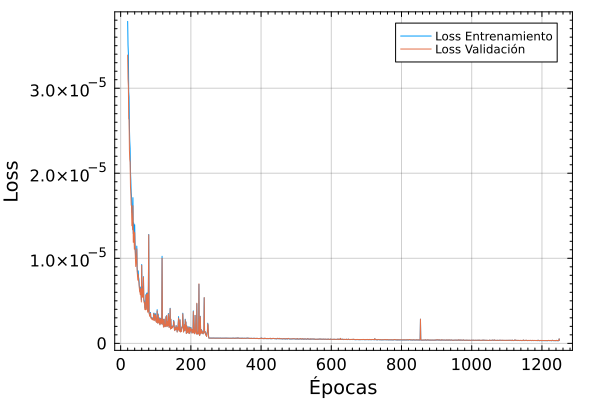

"C:\\Users\\Propietario\\OneDrive\\Escritorio\\ib\\Tesis_V1\\MLonNMR\\2-2-Autoencoders\\Figuras\\LossesDeeperNoLineal.png"

In [22]:
loss_df = CSV.read("C:/Users/Propietario/OneDrive/Escritorio/ib/Tesis_V1/MLonNMR/2-2-Autoencoders/Models/Losses/deeperNLLosses.csv", DataFrame)

loss_train = loss_df[:, 1]
loss_val = loss_df[:, 2]

epochs = 1:length(loss_train)

pl = plot(epochs[20:end], loss_train[20:end], label = "Loss Entrenamiento", xlabel = "Épocas", ylabel = "Loss", legend = :best, tickfontsize=11, labelfontsize=13, legendfontsize=8, framestyle =:box, gridlinewidth=1, xminorticks=10, yminorticks=10, right_margin=5mm)
plot!(epochs[20:end], loss_val[20:end], label = "Loss Validación")

display(pl)

savefig("C:/Users/Propietario/OneDrive/Escritorio/ib/Tesis_V1/MLonNMR/2-2-Autoencoders/Figuras/LossesDeeperNoLineal.pdf")
savefig("C:/Users/Propietario/OneDrive/Escritorio/ib/Tesis_V1/MLonNMR/2-2-Autoencoders/Figuras/LossesDeeperNoLineal.png")

In [23]:
encoder_params, encoder_re = Flux.destructure(autoencoderDeeperNoLineal[1])
decoder_params, decoder_re = Flux.destructure(autoencoderDeeperNoLineal[2])

encoder_params = @views Float32.(CSV.read("C:/Users/Propietario/OneDrive/Escritorio/ib/Tesis_V1/MLonNMR/2-2-Autoencoders/Models/BestParams/mindeeperNLParamsE.csv", DataFrame)[:,1])
decoder_params = @views Float32.(CSV.read("C:/Users/Propietario/OneDrive/Escritorio/ib/Tesis_V1/MLonNMR/2-2-Autoencoders/Models/BestParams/mindeeperNLParamsD.csv", DataFrame)[:,1]);

autoencoderDeeperNoLineal = Chain(encoder_re(encoder_params), decoder_re(decoder_params))

Chain(
  Chain(
    Dense(1099 => 500; bias=false),     # 549_500 parameters
    Dense(500 => 100, relu),            # 50_100 parameters
    Dense(100 => 50, relu),             # 5_050 parameters
    Dense(50 => 3),                     # 153 parameters
  ),
  Chain(
    Dense(3 => 50; bias=false),         # 150 parameters
    Dense(50 => 100, relu),             # 5_100 parameters
    Dense(100 => 500, relu),            # 50_500 parameters
    Dense(500 => 1099),                 # 550_599 parameters
  ),
)                   # Total: 14 arrays, 1_211_152 parameters, 4.621 MiB.

In [24]:
println("Error de recosntrucción RMSE del autoencoder simple en el conjunto de test: ", RMSE_metric(test_signals, autoencoderDeeperNoLineal(test_signals)))

Error de recosntrucción RMSE del autoencoder simple en el conjunto de test: 0.00056004466


Comparado con el error de reconstrucción de PCA (0.006864788124765882) este error del autoencoder con 6 capas ocultas y activacion no lineal es mucho menor, incluso menor que el autoencoder no lineal con 4 capas ocultas.

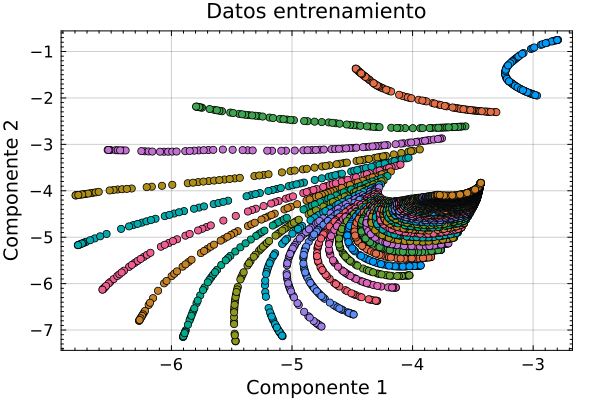

In [25]:
reduced_signals_train = encoder_re(encoder_params)(train_signals)
reduced_signals_val = encoder_re(encoder_params)(val_signals)
reduced_signals_test = encoder_re(encoder_params)(test_signals)

df_train = DataFrame(
    component1 = reduced_signals_train[1, :],
    component2 = reduced_signals_train[2, :],
    component3 = reduced_signals_train[3, :],
    sigma = train_params.sigma,
    lcm = train_params.lcm
)

df_val = DataFrame(
    component1 = reduced_signals_val[1, :],
    component2 = reduced_signals_val[2, :],
    component3 = reduced_signals_val[3, :],
    sigma = val_params.sigma,
    lcm = val_params.lcm
)

df_test = DataFrame(
    component1 = reduced_signals_test[1, :],
    component2 = reduced_signals_test[2, :],
    component3 = reduced_signals_test[3, :],
    sigma = test_params.sigma,
    lcm = test_params.lcm
)


# Plotting with grouping by 'lcm' and coloring by 'sigma'
scatter(df_train.component1, df_train.component2, group = df_train.lcm, 
        title = "Datos entrenamiento", xlabel = "Componente 1", ylabel = "Componente 2", label = false, tickfontsize=11, labelfontsize=13, legendfontsize=8, framestyle =:box, gridlinewidth=1, xminorticks=10, yminorticks=10, right_margin=5mm)

Esta representación es diferente de la de PCA pero es la que menor error de reconstrucción tiene.

In [26]:
reduced_all = encoder_re(encoder_params)(signalsDF_C_unshuffled)
df_reduced = DataFrame(
    component1 = reduced_all[1, :],
    component2 = reduced_all[2, :],
    component3 = reduced_all[3, :],
    sigma = pdistparamsDF_unshuffled.sigma,
    lcm = pdistparamsDF_unshuffled.lcm
);

┌ Warning: Layer with Float32 parameters got Float64 input.
│   The input will be converted, but any earlier layers may be very slow.
│   layer = Dense(1099 => 500; bias=false)  # 549_500 parameters
│   summary(x) = "1099×5600 Matrix{Float64}"
└ @ Flux C:\Users\Propietario\.julia\packages\Flux\FWgS0\src\layers\stateless.jl:50


In [42]:
# Create two scatter plots with color maps
p1 = scatter(df_reduced.component1, df_reduced.component2,
             zcolor = df_reduced.sigma, 
             color = :viridis, 
             xlabel = "Componente 1", 
             ylabel = "Componente 2", 
             title = "Variación σ",
             tickfontsize=11, labelfontsize=13, legendfontsize=8,
             framestyle=:box, gridlinewidth=1, xminorticks=10,
             yminorticks=10, right_margin=1mm)

p2 = scatter(df_reduced.component1, df_reduced.component2,
             zcolor = df_reduced.lcm, 
             color = :viridis,
             xlabel = "Componente 1", 
             ylabel = "Componente 2", 
             title = "Variación lcm",
             tickfontsize=11, labelfontsize=13, legendfontsize=8,
             framestyle=:box, gridlinewidth=1, xminorticks=10,
             yminorticks=10, right_margin=mm)

# Arrange the plots side by side
savefig(p1, "C:/Users/Propietario/OneDrive/Escritorio/ib/Tesis_V1/MLonNMR/2-2-Autoencoders/Figuras/AllDataDeeperNoLinealSigma.png")
savefig(p2, "C:/Users/Propietario/OneDrive/Escritorio/ib/Tesis_V1/MLonNMR/2-2-Autoencoders/Figuras/AllDataDeeperNoLinealLcm.png")

savefig(p1, "C:/Users/Propietario/OneDrive/Escritorio/ib/Tesis_V1/MLonNMR/2-2-Autoencoders/Figuras/AllDataDeeperNoLinealSigma.pdf")
savefig(p2, "C:/Users/Propietario/OneDrive/Escritorio/ib/Tesis_V1/MLonNMR/2-2-Autoencoders/Figuras/AllDataDeeperNoLinealLcm.pdf")


"C:\\Users\\Propietario\\OneDrive\\Escritorio\\ib\\Tesis_V1\\MLonNMR\\2-2-Autoencoders\\Figuras\\AllDataDeeperNoLinealLcm.pdf"

In [ ]:
pl = scatter(df_reduced.component1, df_reduced.component2, group = df_train.lcm, 
        title = "Datos entrenamiento", xlabel = "Componente 1", ylabel = "Componente 2", label = false, tickfontsize=11, labelfontsize=13, legendfontsize=8, framestyle =:box, gridlinewidth=1, xminorticks=10, yminorticks=10, right_margin=5mm)
display(pl)

savefig("C:/Users/Propietario/OneDrive/Escritorio/ib/Tesis_V1/MLonNMR/2-2-Autoencoders/Figuras/AllDataDeeperNoLineal.png")
savefig("C:/Users/Propietario/OneDrive/Escritorio/ib/Tesis_V1/MLonNMR/2-2-Autoencoders/Figuras/AllDataDeeperNoLineal.pdf")

In [74]:
p = PlotlyJS.plot(
    df_reduced,
    kind="scatter",
    mode="markers",
    x=:component1,
    y=:component2,
    color=:lcm,
    text=:sigma,
    hoverinfo="text",
    Layout(
        title="Todos los datos coloreados por lcm",
        xaxis_title="Componente 1",
        yaxis_title="Componente 2",
        font_size=15
    )
)

open("example.html", "w") do io
    PlotlyBase.to_html(io, p.plot)
end

In [75]:

PlotlyJS.plot(
    df_reduced,
    kind="scatter",
    mode="markers",
    x=:component1,
    y=:component2,
    color=:sigma,
    text=:lcm,
    hoverinfo="text",
    Layout(
        title="Todos los datos coloreados por σ",
        xaxis_title="Componente 1",
        yaxis_title="Componente 2",
        font_size=15
    )
)

data: [
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, marker, mode, name, showlegend, text, type, x, xaxis, y, and yaxis",
  "scatter with fields hoverinfo, legendgroup, m

In [76]:
CSV.write("C:/Users/Propietario/OneDrive/Escritorio/ib/Tesis_V1/MLonNMR/2-2-Autoencoders/Models/ReducedDataNLData.csv", df_reduced)

"C:/Users/Propietario/OneDrive/Escritorio/ib/Tesis_V1/MLonNMR/2-2-Autoencoders/Models/ReducedDataNLData.csv"